# Predicting Guest Satisfaction for Airbnbs
### STAT 301 – Group 41, Airbnb Prices in London, Rome & Budapest

#### Group Members:
* Rapeewit Chanprakaisi
* Renata Lovette
* Angelyca Purewal
* Yingqian Shi

## Introduction

In recent years, the sharing economy has revolutionized the hospitality industry, with platforms like Airbnb offering travellers diverse and flexible lodging options across the globe. As Airbnb listings continue to grow, understanding the factors influencing guest satisfaction has become increasingly important for both hosts aiming to improve their offerings and for travellers seeking the best possible experience.

This project focuses on Airbnb listings across major European cities such as London, Rome, and Budapest. The dataset provides detailed information on various listing attributes, including price, location characteristics, listing type, host status, and more. In particular, it includes the `guest_satisfaction_overall` score, which serves as a summary measure of how satisfied guests were with their stay. Given the richness of this dataset, we aim to explore whether it is possible to predict overall guest satisfaction based on these various features.

While prior literature, such as the study by Zhu et al. (2020) and Rezazadeh Kalehbasti et al. (2021), has largely focused on predicting Airbnb prices using spatial and textual features, our work differs by shifting the outcome of interest to guest satisfaction. Their analysis demonstrated that machine learning models like XGBoost and SVR were effective for predicting prices, suggesting that similar approaches may also perform well in predicting satisfaction, though the underlying drivers may differ.

### Question
We want to develop a model to figure out if we can predict guest satisfaction based on factors such as listing price, city (e.g., London, Rome, Budapest), location characteristics (e.g., latitude/longitude, distance from the city center), and Airbnb listing type (e.g., room type, business listing, multiple rooms or not).

**Response Variable:** `guest_satisfaction_overall`

**Primary focus:** Prediction – we are interested in understanding the relationship between all the variables and how they relate to and cause Airbnb guest satisfaction levels.

### Data Description

The dataset includes different determinants of Airbnb prices across different European cities (London, Rome and Budapest) during the weekdays and weekends. For each city, the dataset includes 20 variables that were determined via spatial econometric analysis methods to analyse and identify the determinants of Airbnb prices across these cities. 

|Variable Name | Data Type | Description |
| ---------- | ----------- | ------------ |
| ...1 | numerical - discrete | observation ID |
| realSum | numerical - continuous | price in Euros for a 2 night stay for 2 people |
| room_type | categorical | type of room (ie. shared, private) |
| room_shared | boolean | is the room shared? |
| room_private | boolean | is the room private? |
| person_capacity | numerical - discrete| maximum guest capacity in the room |
| host_is_superhost | boolean | does the host have superhost status? |
| multi | binary | does the property have multiple listings? |
| biz | binary | is the property hosted for business purposes? |
| cleanliness_rating | numerical - continuous | cleanliness rating of the listing |
| guest_satisfaction_overall | numerical - continuous | overall guest satisfaction rating |
| bedrooms | numerical - discrete | number of bedrooms |
| dist | numerical - continuous| distance from the city centre in km|
| metro_dist | numerical - continuous | distance from the nearest metro station in km|
| attr_index | numerical - continuous | attraction index of airbnb location | 
| attr_index_norm | numerical - continuous | normalised attraction index of airbnb location (0-100)|
| rest_index | numerical - continuous | restaurant index of airbnb location |
| rest_index_norm | numerical - continuous | normalised restaurant index of airbnb location (0-100)|
| lng | numerical - continuous | longitude of airbnb location |
| lat | numerical - continuous | latitude of airbnb location |

The number of observations for Airbnbs in...
- London are 4613 (weekdays) and 5378 (weekends)
- Rome are 4491 (weekdays) and 4534 (weekends)
- Budapest are 2073 (weekdays) and 1947 (weekends)


**The data source and citation as requested by the owner(s) is**
> Gyódi, K., & Nawaro, Ł. (2021). Determinants of Airbnb prices in European cities: A spatial econometrics approach (Supplementary Material) [Data set]. Zenodo. https://doi.org/10.5281/zenodo.4446043


## Methods and Results

In [1]:
library(tidyverse)
library(repr)
library(ggplot2)
library(patchwork)
library(caret)
library(glmnet)
library(rsample)
library(car)
library(corrplot)
options(repr.plot.width = 16, repr.plot.height = 10)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Loading required package: lattice


Attaching package: ‘caret’


The following object is masked from ‘package:purrr’:

    lift


Loading required package: Matrix


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack


Loaded glmnet 4.1-8

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:pu

### Exploratory Data Analysis (EDA)

#### Read data

In [2]:
# Loading in the 6 data sets 
budapest_weekdays <- read_csv("https://raw.githubusercontent.com/rchanpra/stat-301-project/refs/heads/main/data/budapest_weekdays.csv")
budapest_weekends <- read_csv("https://raw.githubusercontent.com/rchanpra/stat-301-project/refs/heads/main/data/budapest_weekends.csv")
london_weekdays <- read_csv("https://raw.githubusercontent.com/rchanpra/stat-301-project/refs/heads/main/data/london_weekdays.csv")
london_weekends <- read_csv("https://raw.githubusercontent.com/rchanpra/stat-301-project/refs/heads/main/data/london_weekends.csv")
rome_weekdays <- read_csv("https://raw.githubusercontent.com/rchanpra/stat-301-project/refs/heads/main/data/rome_weekdays.csv")
rome_weekends <- read_csv("https://raw.githubusercontent.com/rchanpra/stat-301-project/refs/heads/main/data/rome_weekends.csv")

New names:
• `` -> `...1`
Rows: 2074 Columns: 20
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (1): room_type
dbl (16): ...1, realSum, person_capacity, multi, biz, cleanliness_rating, gu...
lgl  (3): room_shared, room_private, host_is_superhost

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
New names:
• `` -> `...1`
Rows: 1948 Columns: 20
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (1): room_type
dbl (16): ...1, realSum, person_capacity, multi, biz, cleanliness_rating, gu...
lgl  (3): room_shared, room_private, host_is_superhost

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
New names:
• `` -> `...1`
Rows: 4614 Columns: 20
── Column specification ─────────────────

#### Data Wrangling and Cleaning

In [3]:
# Main developer: Angelyca Purewal 
# Contributors: Rapeewit Chanprakaisi

# Adding two new columns to each of the datasets 
budapest_weekdays_data <- budapest_weekdays %>% mutate(city = "Budapest", time = "Weekday")
budapest_weekends_data <- budapest_weekends %>% mutate(city = "Budapest", time = "Weekend") 
london_weekdays_data <- london_weekdays %>% mutate(city = "London", time = "Weekday")
london_weekends_data <- london_weekends %>% mutate(city = "London", time = "Weekend") 
rome_weekdays_data <- rome_weekdays %>% mutate(city = "Rome", time = "Weekday")
rome_weekends_data <- rome_weekends %>% mutate(city = "Rome", time = "Weekend") 

# Combining all the data sets into a tidy format
airbnb_data <- bind_rows(budapest_weekdays_data, budapest_weekends_data,
                         london_weekdays_data, london_weekends_data,
                         rome_weekdays_data, rome_weekends_data)

# convert boolean to binary
airbnb_data <- airbnb_data %>% mutate(room_shared = ifelse(toupper(room_shared) == "TRUE", 1, 0),
                    room_private = ifelse(toupper(room_private) == "TRUE", 1, 0),
                    host_is_superhost = ifelse(toupper(host_is_superhost) == "TRUE", 1, 0))

head(airbnb_data)

...1,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,⋯,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,city,time
<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
0,238.9905,Entire home/apt,0,0,6,1,0,1,10,⋯,0.3593550,0.3526430,404.4047,24.116552,893.4773,67.65685,19.05074,47.50076,Budapest,Weekday
1,300.7943,Entire home/apt,0,0,6,0,0,1,9,⋯,0.9294272,0.2002355,1676.8760,100.000000,452.5397,34.26770,19.04493,47.50405,Budapest,Weekday
2,162.3819,Entire home/apt,0,0,4,1,0,0,10,⋯,2.4508403,0.2794518,163.5885,9.755551,191.9923,14.53825,19.02170,47.49882,Budapest,Weekday
3,118.4377,Entire home/apt,0,0,2,0,0,0,9,⋯,1.5594494,0.4779711,191.7198,11.433155,326.2156,24.70205,19.06301,47.51126,Budapest,Weekday
4,134.4174,Entire home/apt,0,0,4,1,1,0,10,⋯,1.1138030,0.2701016,198.6035,11.843658,635.5159,48.12322,19.06900,47.49900,Budapest,Weekday
5,127.3676,Entire home/apt,0,0,4,0,1,0,9,⋯,0.2684703,0.1669317,635.6350,37.905903,1005.6535,76.15118,19.05480,47.50094,Budapest,Weekday


In [4]:
# Check for missing values
cat('\nData has', sum(is.na(airbnb_data)), 'rows with missing values.')


Data has 0 rows with missing values.

#### Pre-selection of variables

Let's start by dropping the `...1` column that acts as an identifier as well as the `room_shared` and `room_private` columns. Since the different datasets have been merged into one, the values of the `...1` have become irrelevant, so we remove this column. Additionally, the variable `room_type` already categorizes the listing into private, shared, or entire home/apt, making these additional classifications unnecessary for our analysis. It is also unclear if `room_private` and `room_shared` were classifying a different aspect of the room, so we assume they represent the same information. 

We'll also drop `lng` and `lat` because we haven't learned how to use spatial analysis variables.

In [5]:
# Main developer: Renata Lovette
# Contributors: Angelyca Purewal

In [6]:
# drop ID, 'room_shared' and 'room_private' columns
airbnb_data <- select(airbnb_data, -(c('...1', room_shared, room_private, lng, lat)))
head(airbnb_data)

realSum,room_type,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,city,time
<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
238.9905,Entire home/apt,6,1,0,1,10,99,1,0.3593550,0.3526430,404.4047,24.116552,893.4773,67.65685,Budapest,Weekday
300.7943,Entire home/apt,6,0,0,1,9,98,2,0.9294272,0.2002355,1676.8760,100.000000,452.5397,34.26770,Budapest,Weekday
162.3819,Entire home/apt,4,1,0,0,10,98,1,2.4508403,0.2794518,163.5885,9.755551,191.9923,14.53825,Budapest,Weekday
118.4377,Entire home/apt,2,0,0,0,9,92,1,1.5594494,0.4779711,191.7198,11.433155,326.2156,24.70205,Budapest,Weekday
134.4174,Entire home/apt,4,1,1,0,10,99,2,1.1138030,0.2701016,198.6035,11.843658,635.5159,48.12322,Budapest,Weekday
127.3676,Entire home/apt,4,0,1,0,9,91,2,0.2684703,0.1669317,635.6350,37.905903,1005.6535,76.15118,Budapest,Weekday


In [7]:
# check observations in categorical levels

# roomtype per city
rm_type_per_city_count <- airbnb_data %>%
    group_by(city) %>%
    count(room_type)

rm_type_per_city_count

city,room_type,n
<chr>,<chr>,<int>
Budapest,Entire home/apt,3589
Budapest,Private room,419
Budapest,Shared room,14
London,Entire home/apt,4384
London,Private room,5559
London,Shared room,50
Rome,Entire home/apt,5561
Rome,Private room,3454
Rome,Shared room,12


From the table above, the level of `room_type = "Shared room"` is low incomparison to the other values. If we kept this data in the dataset, there is a high chance that we would encounter problems when splitting the data into training and testing set. There is a chance that all the `"Shared room"` data points might fall into the testing set. Our model wouldn't recognize these points because it wouldn't have been trained on data points where `room_type = "Shared room"`. Thus, we drop this categorical level and remove the data points accordingly.

In [8]:
# remove observations that include room_type = "Shared room"

airbnb_data <- airbnb_data %>% filter(room_type != "Shared room")

rm_type_per_city_count_2 <- airbnb_data %>%
    group_by(city) %>%
    count(room_type)

rm_type_per_city_count_2

city,room_type,n
<chr>,<chr>,<int>
Budapest,Entire home/apt,3589
Budapest,Private room,419
London,Entire home/apt,4384
London,Private room,5559
Rome,Entire home/apt,5561
Rome,Private room,3454


Finally, let's also remove `rest_index` and `attr_index`. Their normalized versions are already included in the dataset to provide a more meaningful and standardized measure, making the raw versions redundant.

In [9]:
airbnb_data <- airbnb_data %>% select(-rest_index, -attr_index)
head(airbnb_data)

realSum,room_type,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,attr_index_norm,rest_index_norm,city,time
<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
238.9905,Entire home/apt,6,1,0,1,10,99,1,0.3593550,0.3526430,24.116552,67.65685,Budapest,Weekday
300.7943,Entire home/apt,6,0,0,1,9,98,2,0.9294272,0.2002355,100.000000,34.26770,Budapest,Weekday
162.3819,Entire home/apt,4,1,0,0,10,98,1,2.4508403,0.2794518,9.755551,14.53825,Budapest,Weekday
118.4377,Entire home/apt,2,0,0,0,9,92,1,1.5594494,0.4779711,11.433155,24.70205,Budapest,Weekday
134.4174,Entire home/apt,4,1,1,0,10,99,2,1.1138030,0.2701016,11.843658,48.12322,Budapest,Weekday
127.3676,Entire home/apt,4,0,1,0,9,91,2,0.2684703,0.1669317,37.905903,76.15118,Budapest,Weekday


#### Visualizations

In [10]:
# Main developer: Angelyca Purewal

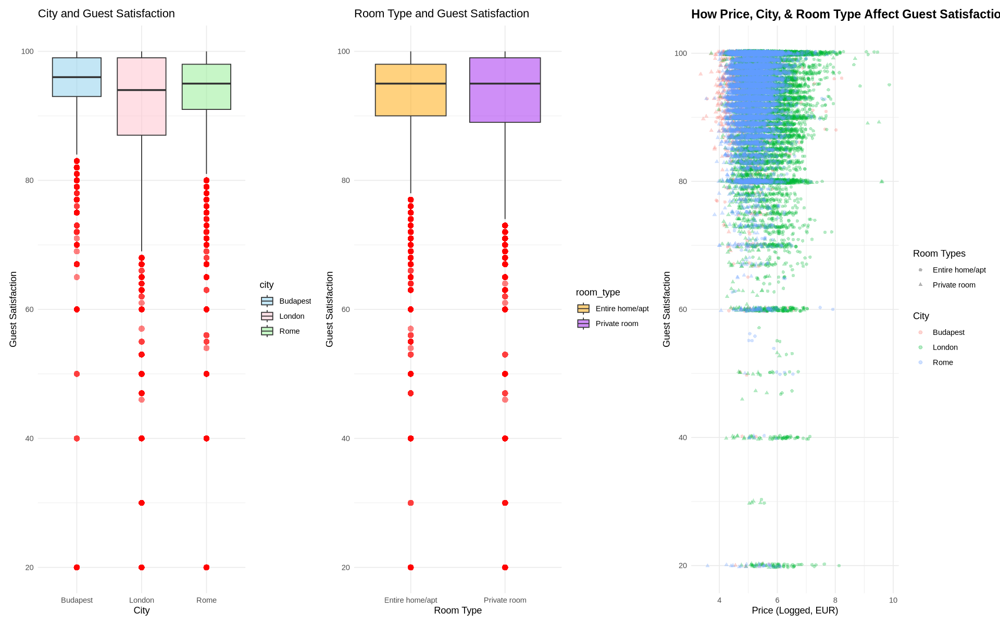

In [11]:
# Visualization 1

# I have logged realSum (the price of the Airbnb listing) because this variable has extreme values, therefore applying the log function 
# will compress large values while maintaining the overall trends.

# Jitter is used to spread some of the points and reduce overlapping.
# Alpha is set to 0.3 because lowering the alpha (opacity) makes denser areas more visible

# scatterplot: price, city, roomtype, guest satisfaction
scatter_plot <- ggplot(airbnb_data, aes(x = log(realSum), y = guest_satisfaction_overall, color = city , shape= room_type)) + 
  geom_jitter(alpha = 0.3, width = 0.3, height = 0.3) + 
  labs(x = "Price (Logged, EUR)", 
       y = "Guest Satisfaction", 
       color = "City", 
       shape= "Room Types",
      title = "How Price, City, & Room Type Affect Guest Satisfaction") +
      theme_minimal() +
      theme(legend.position = "right", 
      plot.title = element_text(size = 14, face = "bold"))

# boxplot: city vs guest satisfaction
box_plot <- ggplot(airbnb_data, aes(x = city, y = guest_satisfaction_overall, fill = city)) +
  geom_boxplot(outlier.shape = 16, outlier.colour = "red", outlier.size = 3, alpha = 0.5) +  
  labs(x = "City", y = "Guest Satisfaction", title = "City and Guest Satisfaction") +
  theme_minimal() +
  scale_fill_manual(values = c("skyblue", "pink", "lightgreen"))

# boxplot: room type vs guest satisfaction
box_plot2 <- ggplot(airbnb_data, aes(x = room_type, y = guest_satisfaction_overall, fill = room_type)) +
  geom_boxplot(outlier.shape = 16, outlier.colour = "red", outlier.size = 3, alpha = 0.5) +  
  labs(x = "Room Type", y = "Guest Satisfaction", title = "Room Type and Guest Satisfaction") +
  scale_fill_manual(values = c("orange", "purple")) + 
  theme_minimal()

box_plot + box_plot2 + scatter_plot 

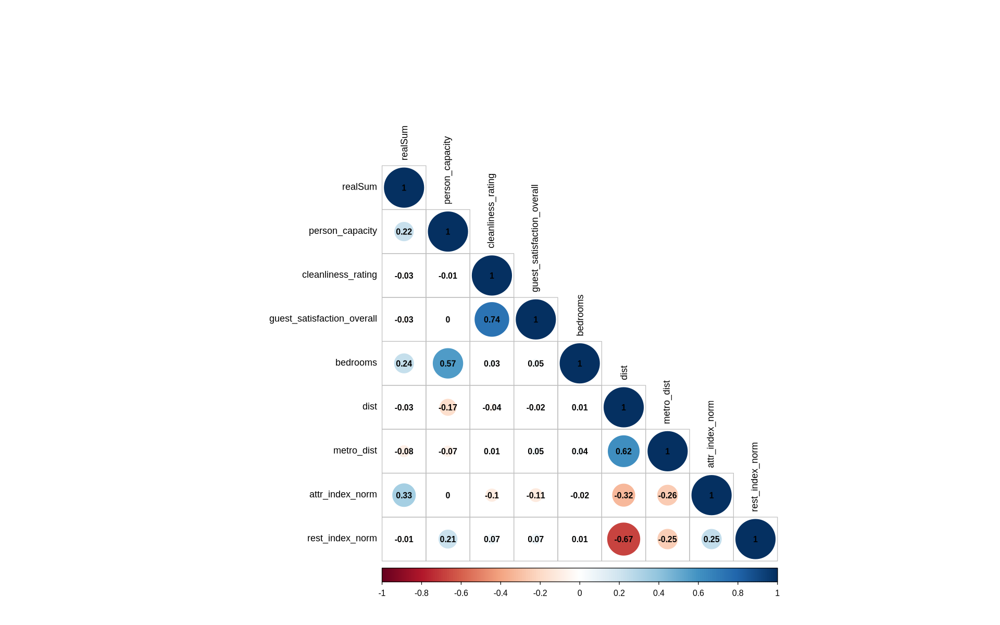

In [12]:
# Visualization 2 – To check variables that might be highly correlated

# Selected the numeric variables to createa a correlation plot
num_vars <- airbnb_data %>%
  select(realSum, person_capacity, cleanliness_rating, guest_satisfaction_overall,
         bedrooms, dist, metro_dist, attr_index_norm, rest_index_norm)

# Correlation matrix 
plot_2 <- corrplot(cor(num_vars, use = "complete.obs"), method = "circle", type = "lower", # Use cirle size and colour to indicate the correlation strenght and direction
         addCoef.col = "black",  # To add the correlation coefficients (pearson correlation coefficient (r))
         tl.col = "black",       
         tl.cex = 0.9,           
         number.cex = 0.8)

#### Visualization Explanation
In the first visualization, we created a scatterplot to explore the general trends in variables potentially associated with guest satisfaction and we also have two box plots to explore the relationship between my categorical variables and guest satisfaction. These box plots show that the median guest satisfaction is different for each city but there is a lot of overlap and my other box plot shows that the two room types have very similar medians and overlap a lot, this tells us how much each variable plays a role in guest satisfaction. The scatterplot gives us a big picture of what is going on in the data. In the second visualization we created a correlation matrix of the numerical variables, to check for multicollinearity, which we will have to deal with later through variable selection methods.

### Methods Plan & Computational Code

#### Methods Plan
**Method(s) of interest:** Multi-covariate Linear Regression model with Lasso for variable selection

To develop a predictive model for guest satisfaction, a continuous variable, we will use multiple predictors such as the price of the listing, city (e.g., London, Rome, Budapest), location (e.g., city center distance), and listing characteristics (e.g., room type, business suitability, number of rooms). Lasso regression will be used, as it is particularly well-suited for this task by penalizing large coefficients, thus improving model interpretability and generalizability. 

Before applying Lasso, we will check for multicollinearity using the Variance Inflation Factor (VIF). VIF values higher than 5 or 10 suggest multicollinearity issues that might require addressing. After checking VIF, we will split the data into a training set (80%) and a testing set (20%). The training data will be standardized and used to fit the Lasso regression model via the glmnet function. The optimal lambda (penalty term) will be selected via cross-validation. Finally, the model's performance will be evaluated using the testing set, and its prediction accuracy will be assessed by computing the Root Mean Squared Error (RMSE).

#### Assumptions

To use an MLR model, we need to assume the following: 

* **Linearity:** The relationship between the dependent variable (guest_satisfaction_overall) and each independent variable should be linear. 
* **Independence:** Observations should be independent of each other. We assume that the dataset includes a random sample of Airbnb listings. 
* **Homoscedasticity:** The variance of residuals should remain constant across predictions.
* **Normality of Residuals:** Residuals should follow a normal distribution 
* No extreme outliers

#### Potential limitations & weaknesses

* **Skewed distribution:** Airbnb guest satisfaction ratings tend to cluster around high values and values that are multiples of 10. Leading to a skewed distribution of the response variable. This may violate normality assumptions. 
* **Multicollinearity:** Some predictors (e.g., location-based features) might be highly correlated, requiring ridge or lasso regression to improve model stability. Multicollinearity occurs when there is a strong association between two or more covariates. These covariates bring similar information to the model, and we have trouble isolating their effect. During the EDA stage, we've removed `room_shared` and `room_private` because they measured the same attribute. There may be other variables that will contribute to multicollinearity, so we will use VIF to check for highly correlated predictors.

**Lasso will be used to mitage the previous limitation however this method adds its on limitations to the mix.**
>* Lasso can shrink coefficients of predictors too much, sometimes pushing important predictors to zero. This could result in an overly simplified model, losing useful information for prediction or interpretation.
>* Lasso introduces bias into the model coefficients, especially for highly correlated predictors. While this helps in reducing overfitting, it can distort the true relationship between predictors and the outcome.
>* Lasso assumes a linear relationship and does not automatically account for interaction terms between predictors. If there are important interactions, Lasso may not capture them unless explicitly included in the model.

In [13]:
# Main developer: Angelyca Purewal
# Contributors: Renata Lovette

In [14]:
# set seed for reproducibility
set.seed(123)

# splot the data into trainingg (80%) and testing (20%) sets
airbnb_split <-
    airbnb_data %>%
    initial_split(prop = 0.8, strata = guest_satisfaction_overall)

train_data <- training(airbnb_split)
test_data <- testing(airbnb_split)

In [15]:
# fit model with all predictors
mlr_model <- lm(guest_satisfaction_overall ~ ., data = train_data)  # Fit model with all predictors
summary(mlr_model)


Call:
lm(formula = guest_satisfaction_overall ~ ., data = train_data)

Residuals:
    Min      1Q  Median      3Q     Max 
-77.709  -2.143   0.604   3.163  34.427 

Coefficients:
                        Estimate Std. Error t value Pr(>|t|)    
(Intercept)           31.3788115  0.5404645  58.059  < 2e-16 ***
realSum                0.0002273  0.0001553   1.464 0.143194    
room_typePrivate room  0.5235988  0.1232109   4.250 2.15e-05 ***
person_capacity       -0.0099721  0.0519793  -0.192 0.847864    
host_is_superhost      1.5669630  0.1118002  14.016  < 2e-16 ***
multi                 -0.7798785  0.1183055  -6.592 4.46e-11 ***
biz                   -2.5321455  0.1203530 -21.039  < 2e-16 ***
cleanliness_rating     6.6375584  0.0491870 134.945  < 2e-16 ***
bedrooms               0.3665806  0.0992950   3.692 0.000223 ***
dist                  -0.0144839  0.0377551  -0.384 0.701258    
metro_dist             0.2896782  0.0636307   4.552 5.34e-06 ***
attr_index_norm       -0.0032485  0.0081

In [16]:
# use VIF to conduct an initial check for multicolinearity – values higher than 5 or 10 suggest multicollinearity might be problematic.
vif(mlr_model) %>% round(3)

,GVIF,Df,GVIF^(1/(2*Df))
realSum,1.285,1,1.133
room_type,1.724,1,1.313
person_capacity,2.160,1,1.470
host_is_superhost,1.134,1,1.065
multi,1.433,1,1.197
biz,1.561,1,1.249
cleanliness_rating,1.120,1,1.058
bedrooms,1.592,1,1.262
dist,4.495,1,2.120
metro_dist,1.881,1,1.371


The table above shows low to moderate multicolinearity so we will use Lasso for further variable selection.

In [17]:
X_train <- model.matrix(guest_satisfaction_overall ~ ., data = train_data)[, -1]  # Remove intercept
y_train <- train_data$guest_satisfaction_overall
X_test <- model.matrix(guest_satisfaction_overall ~ ., data = test_data)[, -1]
y_test <- test_data$guest_satisfaction_overall

# Standardize predictors
X_train_scaled <- scale(X_train)
X_test_scaled <- scale(X_test, center = attr(X_train_scaled, "scaled:center"), scale = attr(X_train_scaled, "scaled:scale"))

# Perform Lasso Regression with cross-validation
cv_lasso <- cv.glmnet(X_train_scaled, y_train, alpha = 1)  # Lasso (alpha = 1)

# Get the best lambda
best_lambda_lasso <- cv_lasso$lambda.min

# Train the final Lasso model using best lambda
lasso_model <- glmnet(X_train_scaled, y_train, alpha = 1, lambda = best_lambda_lasso)

In [18]:
# see variables selected by Lasso
lasso_coefs <- coef(lasso_model, s = best_lambda_lasso)
lasso_coefs

16 x 1 sparse Matrix of class "dgCMatrix"
                                s1
(Intercept)           92.317276290
realSum                0.046770022
room_typePrivate room  0.222582959
person_capacity        .          
host_is_superhost      0.682350760
multi                 -0.332579908
biz                   -1.189589452
cleanliness_rating     6.594705998
bedrooms               0.194417871
dist                   .          
metro_dist             0.260235002
attr_index_norm        .          
rest_index_norm        0.126769895
cityLondon            -0.812724542
cityRome              -0.843716776
timeWeekend           -0.002042008

Lasso has shrunk `person_capacity`, `dist` and `attr_index_norm` variables to 0. We will now compare the performance of the Lasso model to the full MLR model.

In [19]:
test_pred_full <- predict(mlr_model, newdata = test_data)

# compute RMSE of the full predictive model
airbnb_test_RMSEs <- tibble(
  Model = "OLS Full Regression",
  RMSE = mltools::rmse(
    preds = test_pred_full,
    actuals = test_data$guest_satisfaction_overall
  )
)

# compute RMSE of lasso predictive model
test_pred_lasso <- predict(lasso_model, s = best_lambda_lasso, newx = X_test_scaled)

airbnb_test_RMSEs <- rbind(
  airbnb_test_RMSEs,
  tibble(
    Model = "Lasso with minimum MSE",
    RMSE = mltools::rmse(
       pred = test_pred_lasso,
       actuals = y_test)
  )
)
airbnb_test_RMSEs

Model,RMSE
<chr>,<dbl>
OLS Full Regression,6.127537
Lasso with minimum MSE,6.127784


#### Analysing RMSE values

The RMSE values of the full MLR model and the Lasso model are nearly identical with a difference of 0.000174, which is practically negligible. The Lasso model excluded 3 coefficients. Due to the very minor difference, it suggests that our data doesn't suffer much from multicollinearity.

### Visualizing Predictions

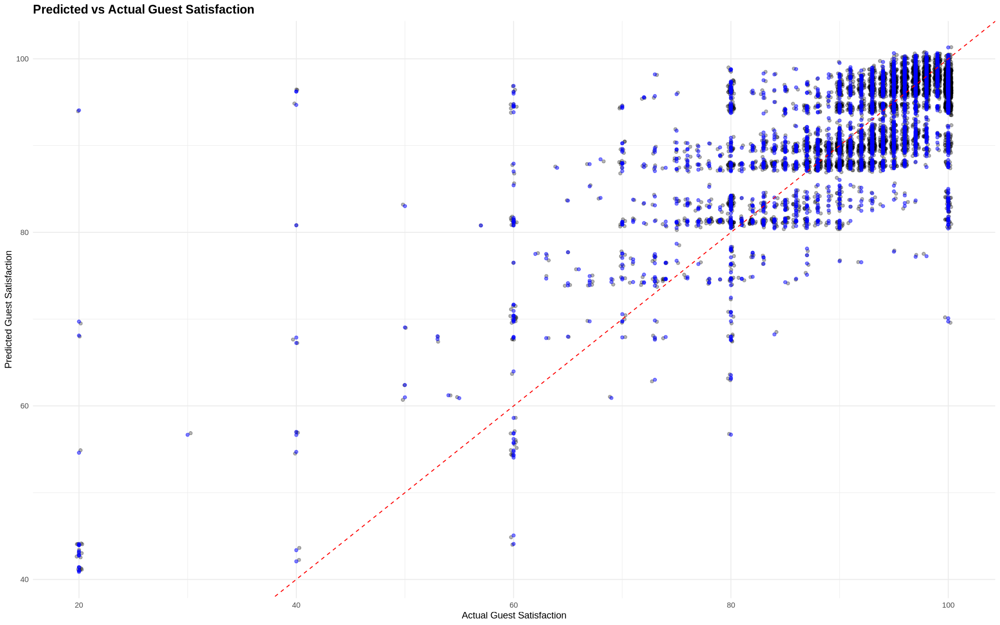

In [21]:
# Main developer: Angelyca Purewal

# Create a data frame with actual and predicted values
prediction_data <- data.frame(Actual = test_data$guest_satisfaction_overall, 
                              s1 = test_pred_lasso)

# Scatter plot: Predicted vs Actual
predicted_actual_plot <- ggplot(prediction_data, aes(x = Actual, y = s1)) +
  geom_jitter(alpha = 0.3, width = 0.3, height = 0.3) + # jitter is used in order to spread some of the points and reduce overlapping
  geom_point(color = "blue", alpha = 0.5) +  # Points for Predicted vs Actual values
  geom_abline(slope = 1, intercept = 0, color = "red", linetype = "dashed") +  # Line of perfect prediction
  labs(title = "Predicted vs Actual Guest Satisfaction", 
       x = "Actual Guest Satisfaction", 
       y = "Predicted Guest Satisfaction") +
  theme_minimal() +
  theme(legend.position = "right", 
  plot.title = element_text(size = 14, face = "bold"))

predicted_actual_plot

#### Visualization Interpretation

If this model was perfect, all points would fall on the red line, instead, we have a spread around the line, indicating prediction error. This model predicts high guest satisfaction fairly well, because most of our training data consisted of higher ratings, which is also why this model struggles to predict low satisfaction scores, often overestimating them. The predictions are also compressed toward the average, a common effect of Lasso regression shrinking extreme values. To improve, we would need to address the imbalance in low-rated listings.


## Discussion

This analysis demonstrated that guest satisfaction on Airbnb can be partially predicted using listing characteristics and location data. While Lasso regression provided a good balance between bias and variance, several challenges and limitations affected the model’s accuracy. Price, cleanliness, and location-based variables were among the most predictive features. Guest satisfaction tends to be biased upward, with many listings having high ratings, complicating the prediction of lower scores.

The model provided a reasonable fit for most observations, especially those with satisfaction scores clustered around the average. Lasso regression helped to reduce overfitting and offered interpretability by automatically selecting relevant variables. The low RMSE on the test set suggests that our model has moderate predictive power for new listings.

Our results emphasise that satisfaction is multifactorial, driven not only by price but also by location, cleanliness, and room features. The importance of cleanliness and amenities in increasing guest loyalty and satisfaction.(Xu and Gursoy, 2020) For hosts, improving cleanliness ratings and carefully setting price levels may improve the guest experience. For Airbnb as a platform, refining satisfaction metrics like collecting more detailed feedback or using a broader rating scale may support better model training and platform trust.

### Limitations
The guest satisfaction variable has a left-skewed distribution, with most values concentrated near 100.  This limits the model’s ability to distinguish well between average and excellent listings and to identify factors contributing to dissatisfaction. And a few listings received low satisfaction scores, which limits the model’s ability to learn patterns from negative feedback. It may cause an imbalance in the response variable and then introduce bias in model evaluation.

To improve model performance, we suggest implementing ensemble models like Random Forest or Gradient Boosted Trees, which can better capture nonlinear relationships and interaction effects.

### Future Research
Future research could incorporate temporal features such as booking dates, seasons, and day-of-week effects to analyze how guest satisfaction varies over time. For example, satisfaction may dip during peak tourist seasons due to higher prices or stretched host resources, while winter off-season listings might show higher satisfaction due to quieter environments and better host availability. Including time-based variables could uncover seasonal patterns and improve model accuracy by capturing temporal dynamics often overlooked in static models.

## References

Airbnb prices in European cities. (2024, March 10). Kaggle. https://www.kaggle.com/datasets/thedevastator/airbnb-prices-in-european-cities

Gyódi, K., & Nawaro, Ł. (2021). Determinants of Airbnb prices in European cities: A spatial econometrics approach (Supplementary Material) [Dataset]. In Zenodo (CERN European Organization for Nuclear Research). https://doi.org/10.5281/zenodo.4437019

Rezazadeh Kalehbasti, P., Nikolenko, L., & Rezaei, H. (2021). Airbnb price prediction using machine learning and sentiment analysis. In E. Weippl, A. Holzinger, A. M. Tjoa & P. Kieseberg (Eds.), Machine learning and knowledge extraction (pp. 173-184). Springer International Publishing AG. https://doi.org/10.1007/978-3-030-84060-0_11

Xu, X., & Gursoy, D. (2020). Exploring the relationship between servicescape, place attachment, and intention to recommend accommodations marketed through sharing economy platforms. Journal of Travel & Tourism Marketing, 37(4), 429–446. https://doi.org/10.1080/10548408.2020.1784365 
